In [25]:
# !pip install venn

In [2]:
import os

import numpy as np
import pandas as pd
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"
import warnings

warnings.filterwarnings("ignore")
# warnings.filterwarnings(action='once')

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

%matplotlib inline
# plots
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import sklearn
import tensorflow as tf
from PIL import Image
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    plot_confusion_matrix,
    precision_recall_curve,
    precision_score,
    recall_score,
    roc_auc_score,
    roc_curve,
)
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from tensorflow import keras
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.layers import (
    AveragePooling2D,
    AvgPool2D,
    Conv2D,
    Dense,
    Flatten,
    GlobalAveragePooling2D,
    MaxPooling2D,
)
from tensorflow.keras.models import Sequential

# keras
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import notebook, tqdm

# from venn import venn

In [3]:
PATH = "/app/_data/"
BATCH_SIZE = 64
SEED = 42

In [6]:
labels = pd.read_csv(PATH + "train.csv")

In [7]:
labels.head()
labels.info()

,image,labels
0,800113bb65efe69e.jpg,healthy
1,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex
2,80070f7fb5e2ccaa.jpg,scab
3,80077517781fb94f.jpg,scab
4,800cbf0ff87721f8.jpg,complex


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18632 entries, 0 to 18631
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   18632 non-null  object
 1   labels  18632 non-null  object
dtypes: object(2)
memory usage: 291.2+ KB


In [8]:
labels.image.duplicated().sum()

0

In [9]:
labels["labels"].value_counts(normalize=True)

scab                               0.259017
healthy                            0.248175
frog_eye_leaf_spot                 0.170728
rust                               0.099828
complex                            0.085981
powdery_mildew                     0.063547
scab frog_eye_leaf_spot            0.036818
scab frog_eye_leaf_spot complex    0.010734
frog_eye_leaf_spot complex         0.008856
rust frog_eye_leaf_spot            0.006441
rust complex                       0.005206
powdery_mildew complex             0.004669
Name: labels, dtype: float64

In [10]:
# def resize_im(
#     image_name, new_folder_name="small_bicubic", size=(224, 224), resample=Image.BICUBIC
# ):
#     image = Image.open(PATH + "train_images/" + image_name)
#     image = image.resize(size, resample=resample)
#     if not os.path.isdir(PATH + "train_images/" + new_folder_name + "/"):
#         os.mkdir(PATH + "train_images/" + new_folder_name + "/")
#     image.save(PATH + "train_images/" + new_folder_name + "/" + image_name)
# labels['image'].apply(resize_im)

0        None
1        None
2        None
3        None
4        None
         ... 
18627    None
18628    None
18629    None
18630    None
18631    None
Name: image, Length: 18632, dtype: object

## Labels

In [34]:
labels = labels.join(labels["labels"].str.get_dummies(sep=" "))

In [35]:
labels.head()

,image,labels,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab
0,800113bb65efe69e.jpg,healthy,0,0,1,0,0,0
1,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex,1,1,0,0,0,1
2,80070f7fb5e2ccaa.jpg,scab,0,0,0,0,0,1
3,80077517781fb94f.jpg,scab,0,0,0,0,0,1
4,800cbf0ff87721f8.jpg,complex,1,0,0,0,0,0


In [11]:
labels["multi_label"] = labels["labels"].astype("category").cat.codes

In [12]:
# weights for multilabel classes
dict_weights = (
    1
    / labels["multi_label"].value_counts()
    / np.sum(1 / labels["multi_label"].value_counts())
).to_dict()

In [13]:
def weight_fill(x):
   return dict_weights[x]

In [14]:
labels['weights'] = labels["multi_label"].apply(weight_fill)

In [17]:
labels.index = labels["image"].str.slice(0, -4)

In [18]:
labels.head()

,image,labels,cider_apple_rust,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab,multi_label,weights
image,,,,,,,,,,,
800113bb65efe69e,800113bb65efe69e.jpg,healthy,0,0,0,1,0,0,0,4,0.004764
8002cb321f8bfcdf,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex,0,1,1,0,0,0,1,11,0.110133
80070f7fb5e2ccaa,80070f7fb5e2ccaa.jpg,scab,0,0,0,0,0,0,1,9,0.004564
80077517781fb94f,80077517781fb94f.jpg,scab,0,0,0,0,0,0,1,9,0.004564
800cbf0ff87721f8,800cbf0ff87721f8.jpg,complex,0,1,0,0,0,0,0,1,0.013749


## plots

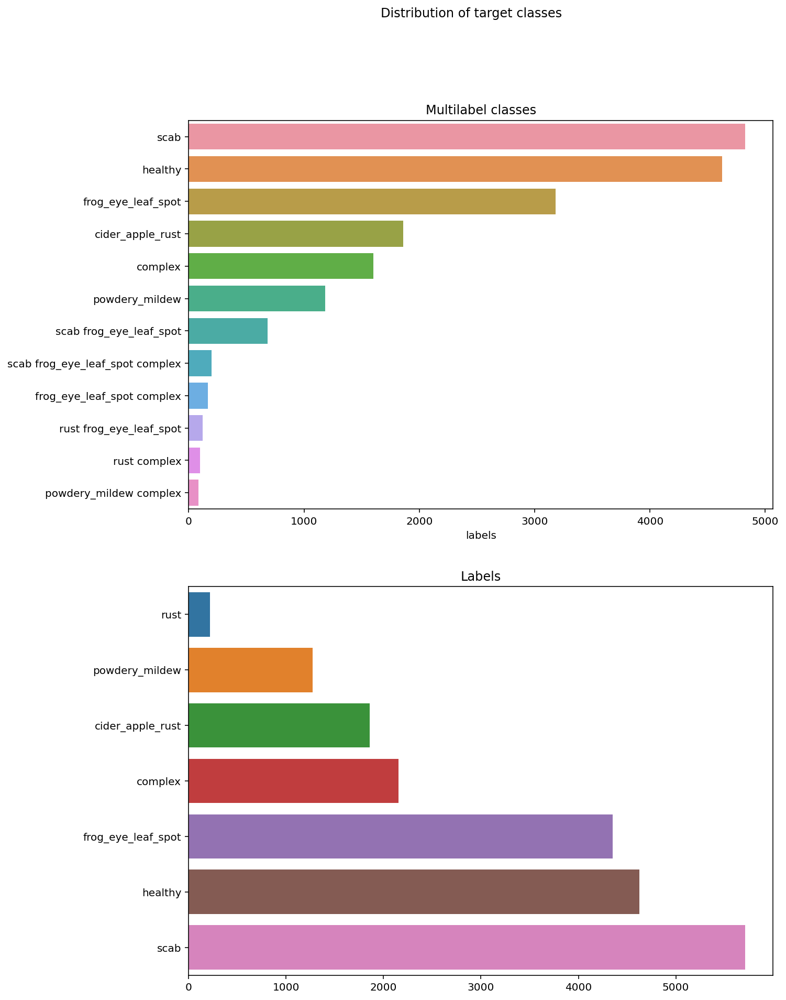

In [29]:
plt.figure(figsize=(10, 15))
plt.suptitle("Distribution of target classes")
plt.subplot(2, 1, 1)
plt.title("Multilabel classes")
sns.barplot(
    y=labels["labels"].value_counts().index,
    x=labels["labels"].value_counts(),
    orient="h",
)
plt.subplot(2, 1, 2)
plt.title("Labels")
sns.barplot(
    x=labels.iloc[:, 2:9].sum().sort_values(),
    y=labels.iloc[:, 2:9].sum().sort_values().index,
)
plt.show();

In [ ]:
fig = px.parallel_categories(labels[feature_columns], color="healthy", color_continuous_scale="sunset",\
                             title="Parallel categories plot of targets")
fig

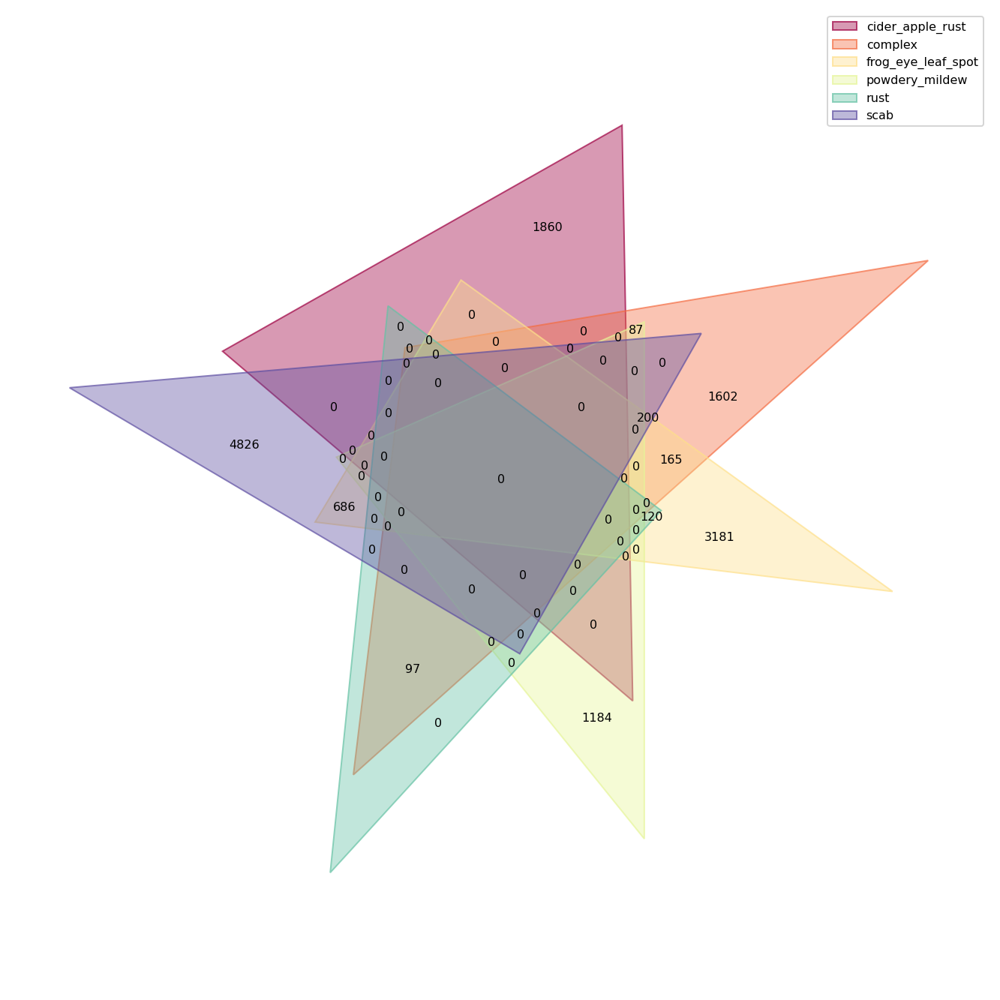

In [27]:
# venn diagram for comment type intersections

classes = [
    "cider_apple_rust",
    "complex",
    "frog_eye_leaf_spot",
    "powdery_mildew",
    "rust",
    "scab",
]
venn_dict = {}

for c in classes:
    venn_dict[c] = set(labels.loc[labels[c] == 1].index.to_numpy())

venn(venn_dict, cmap="Spectral", fontsize=8, figsize=(12, 12));

In [20]:
def show_image(disease, num_image=4):
    plt.figure(figsize=(15, 3 * np.ceil(num_image/4)))
    data = labels.query("labels == @disease").sample(num_image)
    for j, image_name in enumerate(data["image"]):
        image = mpimg.imread("/app/_data/train_images/small_nearest/" + image_name)
        plt.subplot(np.ceil(num_image/4), 4, j + 1)
        plt.title(disease)
        plt.imshow(image,aspect='auto')
        plt.xticks([])
        plt.yticks([])
#     plt.tight_layout()
    plt.show();

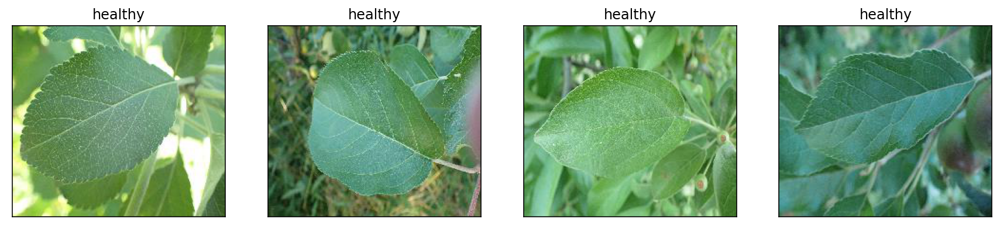

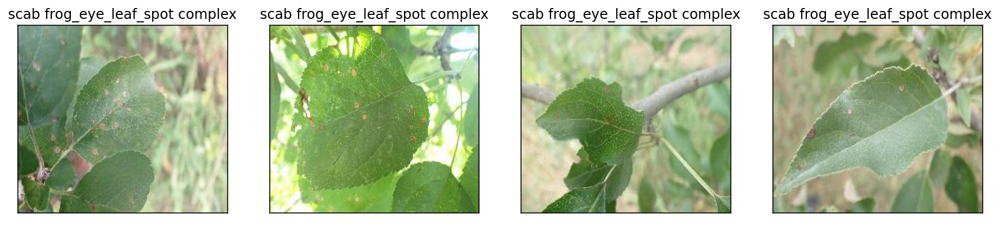

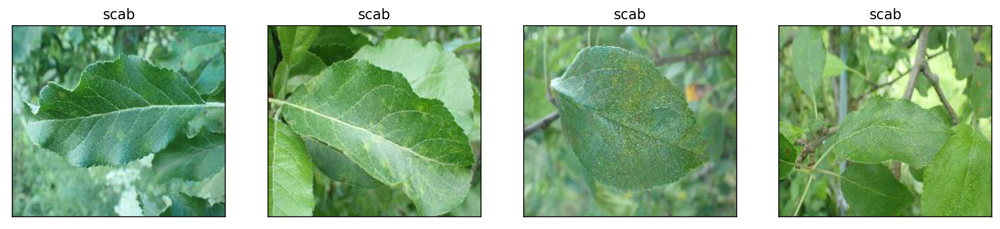

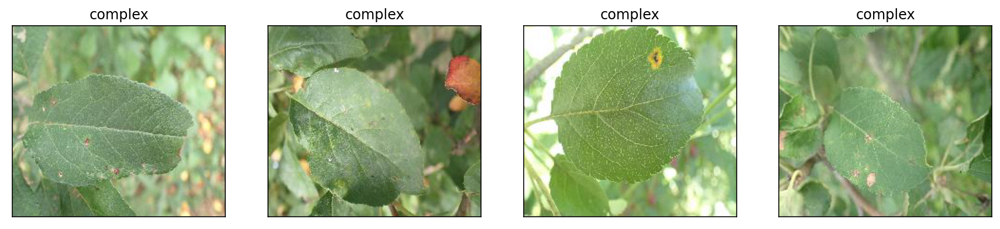

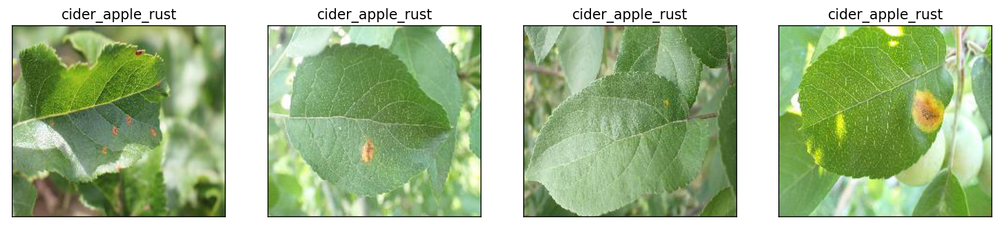

...

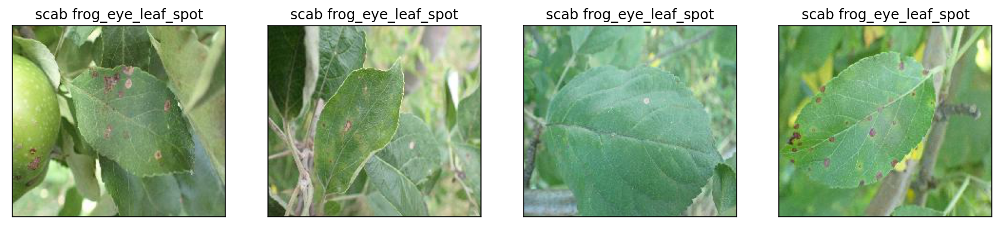

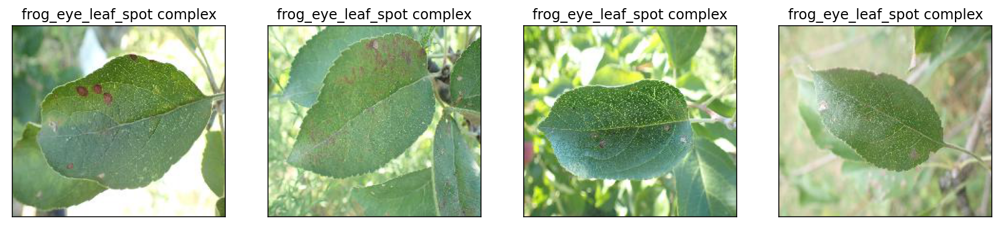

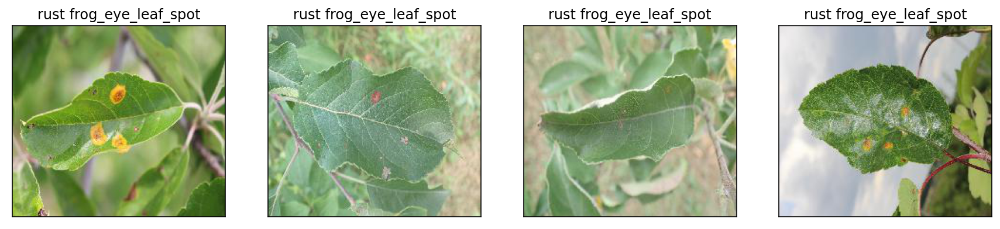

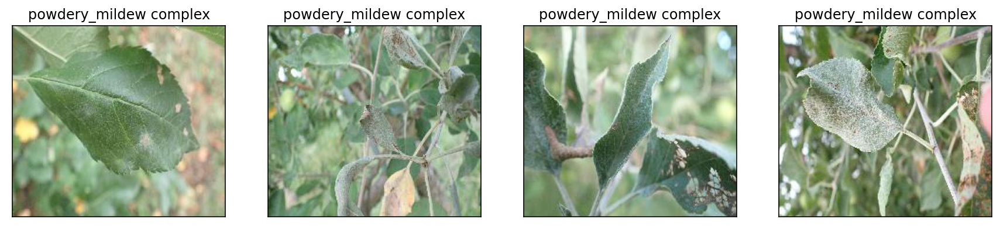

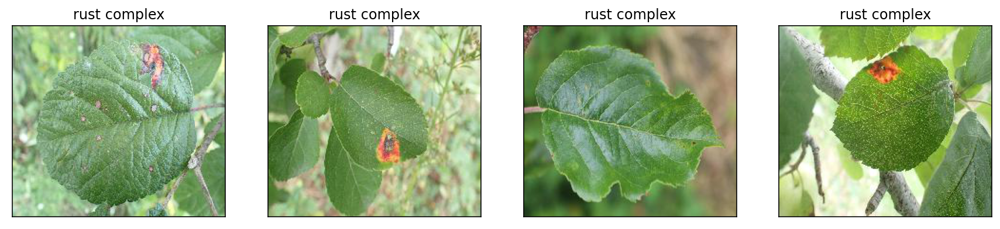

In [21]:
for disease in labels["labels"].unique():
    show_image(disease, 4)